# Lexical norms from Lancaster Sensorimotor Norms
Single predictor models using [Lancaster Sensorimotor Norms](https://www.lancaster.ac.uk/psychology/lsnorms).

In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
from tools.create import create_single_models
from tools.base import (dump_collection, load_collection, 
                        flatten_collection, compute_metrics,
                        _extract_regressors)
from tools.viz import (plot_regressor, plot_regressor,
                       plot_metrics, plot_contrast_by_dataset, plot_contrast_by_analysis,
                       plot_analysis_grid)
from pyns import Neuroscout
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path
%matplotlib inline

Set up API by importing credentials as environment variables.

In [2]:
api = Neuroscout()

## Define predictors and confounds

In [3]:
predictors = ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean',
             'lancastersensorimotornorms_Olfactory.mean', 'lancastersensorimotornorms_Haptic.mean',
             'lancastersensorimotornorms_Gustatory.mean', 'lancastersensorimotornorms_Interoceptive.mean',
             'lancastersensorimotornorms_Foot_leg.mean', 'lancastersensorimotornorms_Hand_arm.mean',
             'lancastersensorimotornorms_Head.mean', 'lancastersensorimotornorms_Mouth.mean',
             'lancastersensorimotornorms_Torso.mean']

In [4]:
confounds = ['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02', 'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05', 'trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']

In [5]:
control = ['speech']

## Create single predictor models

In [6]:
transformations = [{"Name": "Scale", 
                    "Demean": True, 
                    "Rescale": True,
                    "ReplaceNA": "after", 
                    "Input": [p]} for p in predictors]

In [12]:
single_models = create_single_models(predictors, confounds, control=control,
                                     transformations=transformations)

In [3]:
filename = Path('models') / 'lexical_sensorimotor_norms.json'

In [20]:
dump_collection(single_models, filename)

In [4]:
single_models = load_collection(filename)

## Generate reports

In [ ]:
for (pred, dataset, task), model in flatten_collection(single_models):
    model.generate_report(run_id=model.runs[0])

In [ ]:
for p in predictors:
    single_models[p]['Raiders']['raiders'].plot_report()

## Inspect regressors

In [ ]:
df = _extract_regressors(single_models)

In [ ]:
plot_regressor('distribution', df=df, split_by='hue', color=None, aspect=3, hist=None, rug=True)

In [ ]:
plot_regressor('timeseries', df=df, split_by='row', height=1.2, aspect=10)

In [ ]:
agg_df = compute_metrics(df=df, aggfunc=[np.mean, np.std, np.var])

In [ ]:
plot_metrics(agg_df, metrics=['mean', 'std', 'var'],
             sns_function='barplot', height=3, aspect=1)

## Compile models

In [6]:
for (pred, dataset, task), model in flatten_collection(single_models):
    if model.get_status()['status'] == 'DRAFT':
        model.compile()
    else:
        print(f'Status: {model.status} for {pred}, {dataset}, {task}')

## Results

In [81]:
flat_models = flatten_collection(single_models)

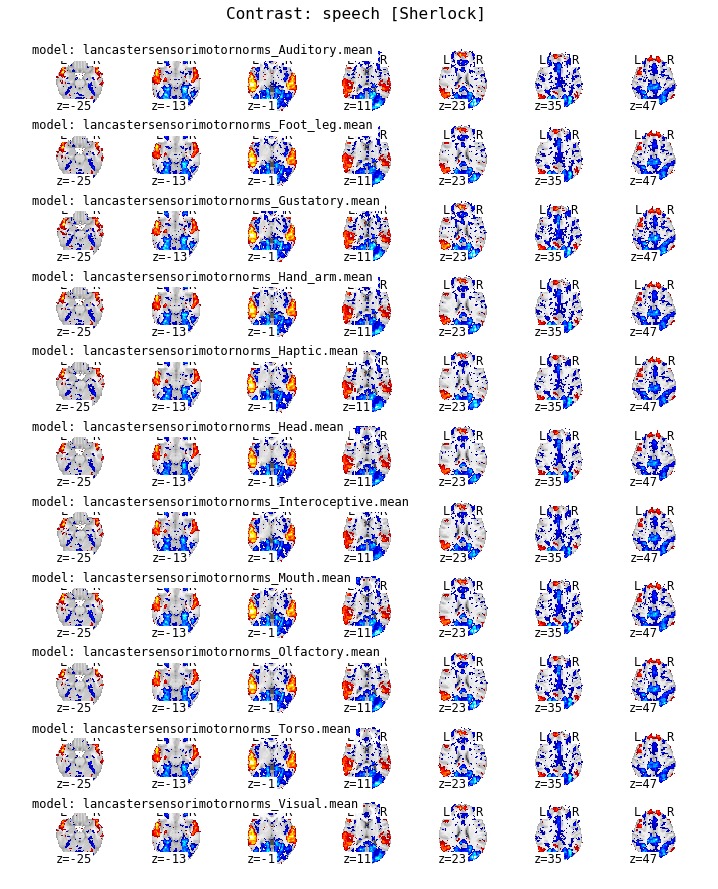

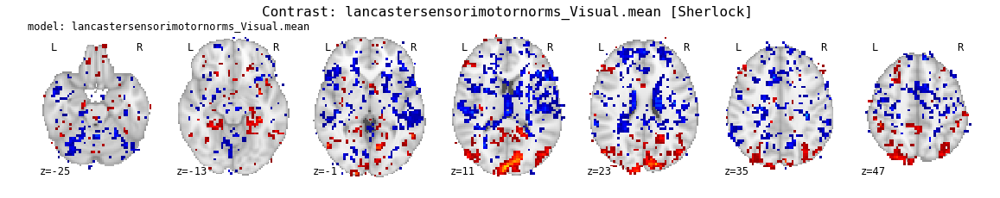

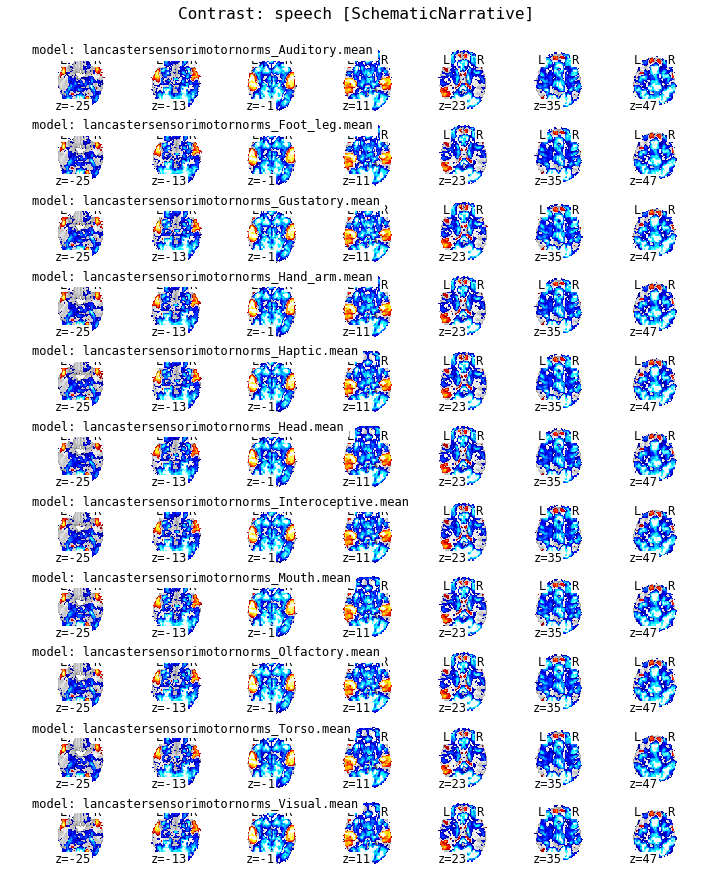

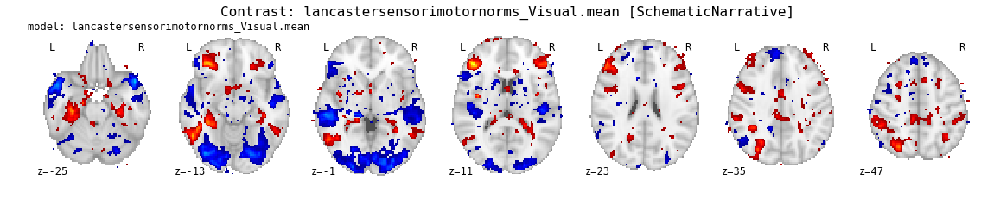

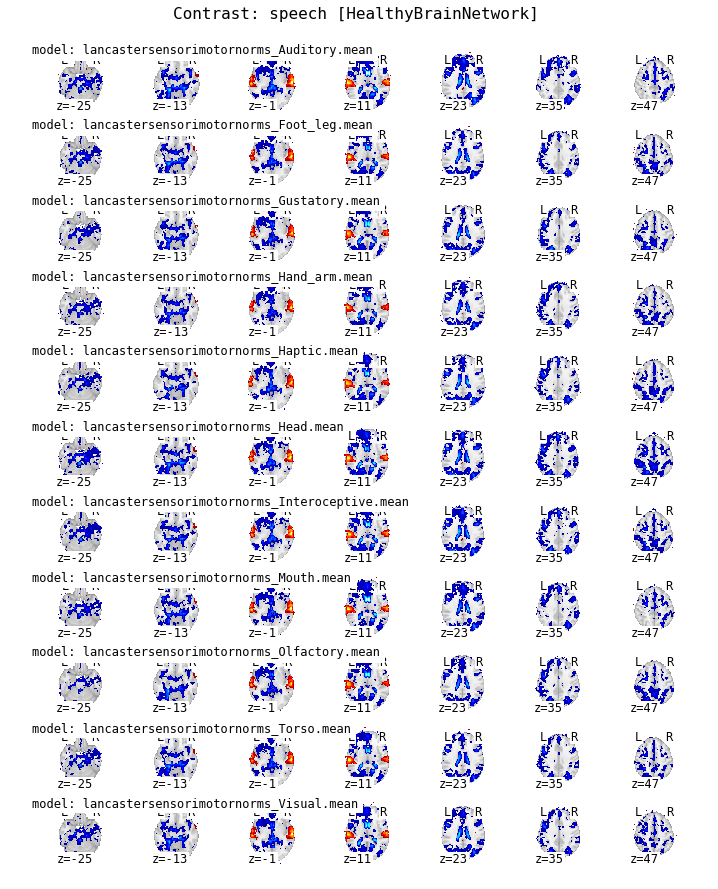

...

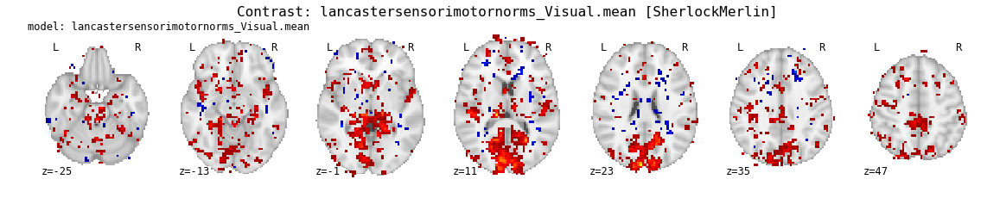

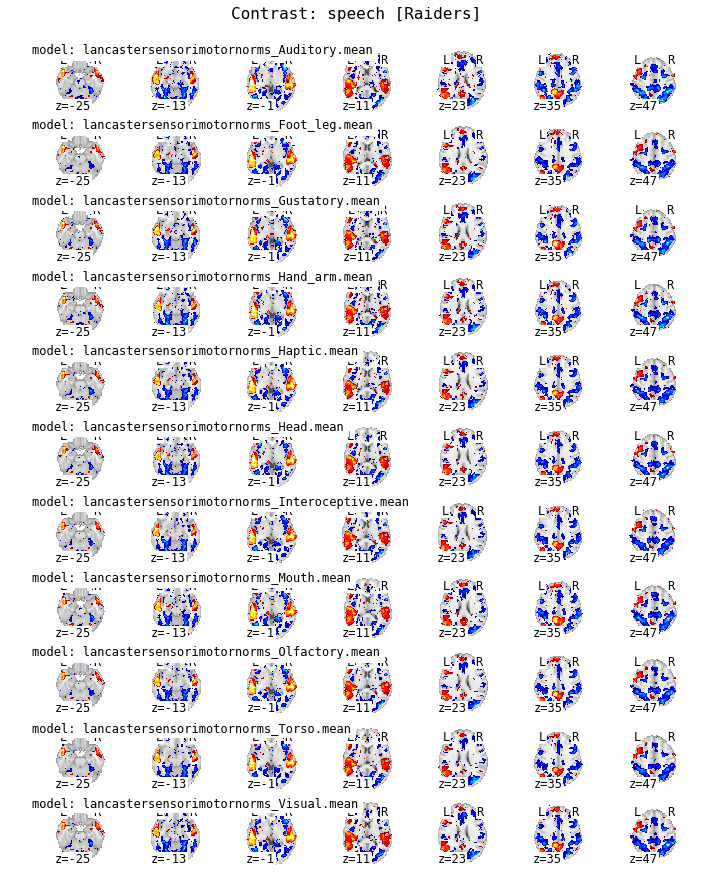

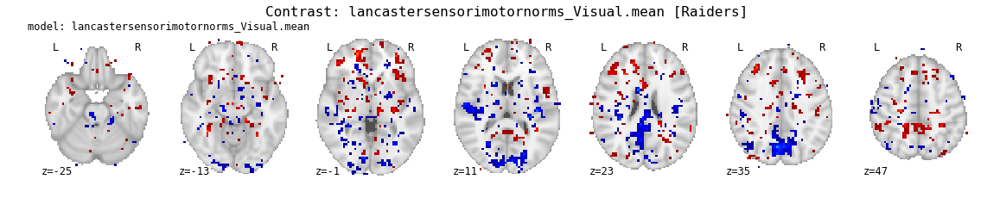

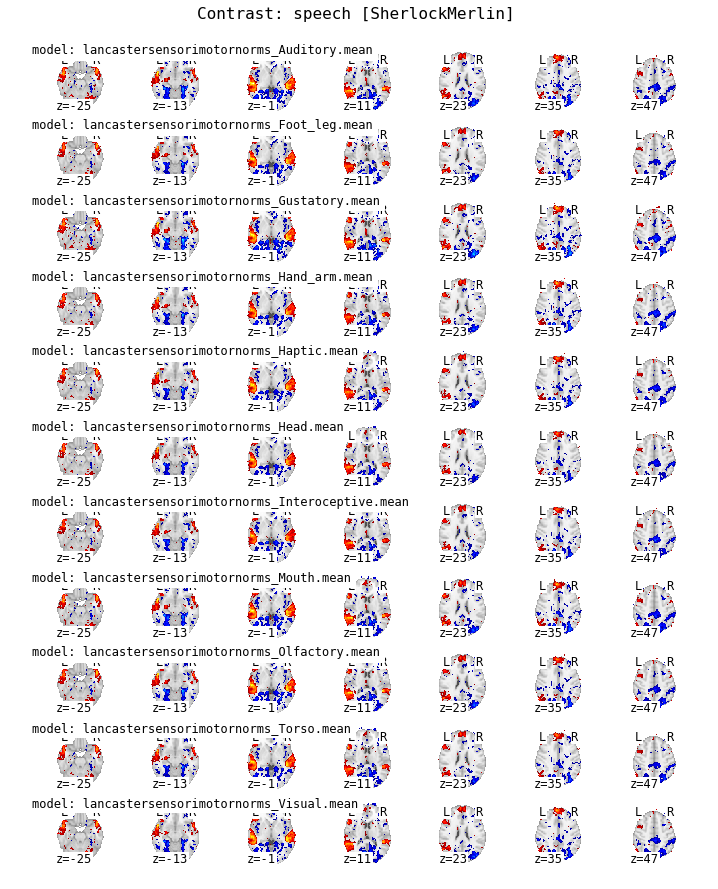

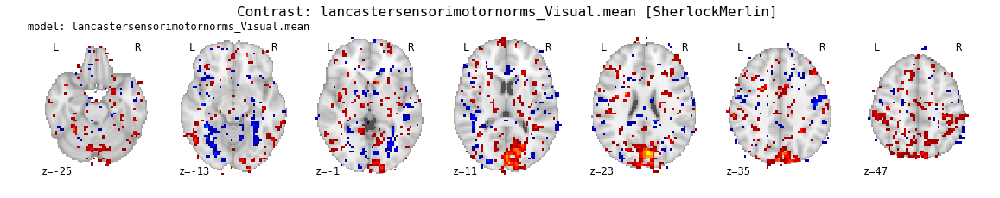

In [82]:
plt.rcParams.update({'font.family': 'monospace'})
plot_contrast_by_dataset(flat_models,
                         vmax=10, display_mode='z', figsize=(12,15),
                         threshold=1.96, colorbar=False)

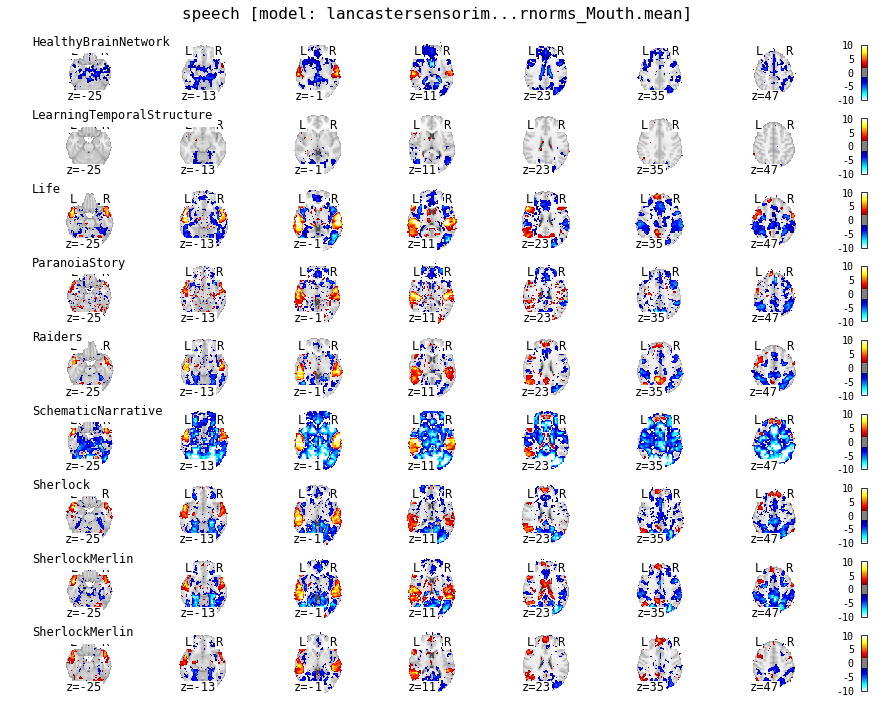

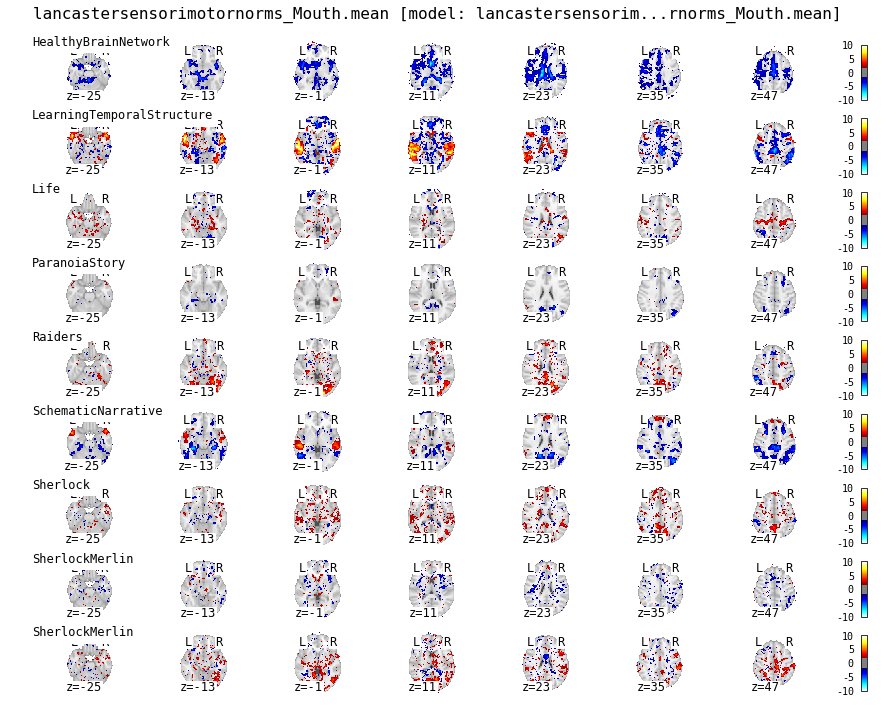

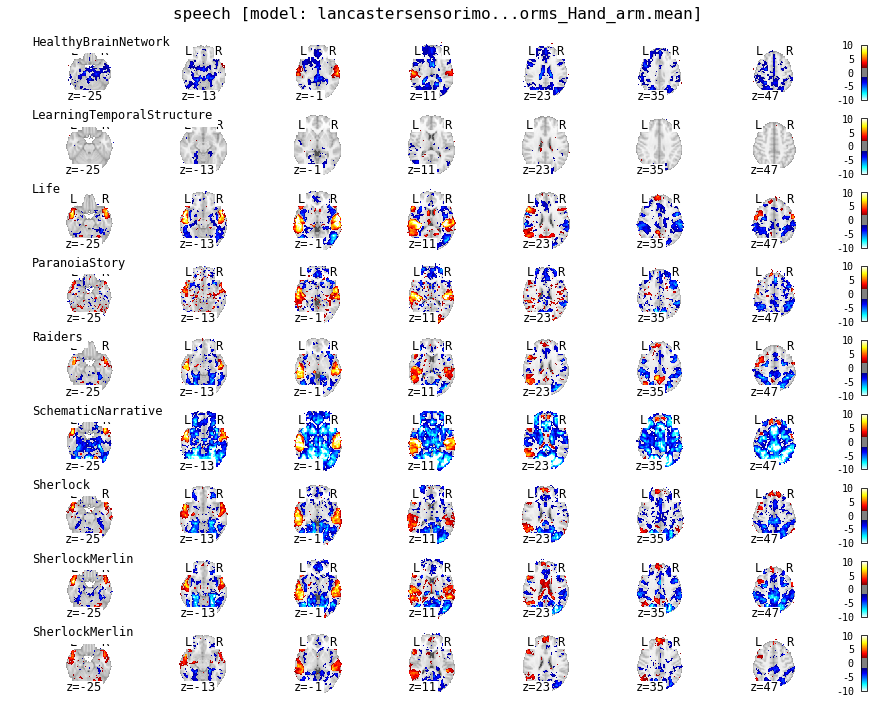

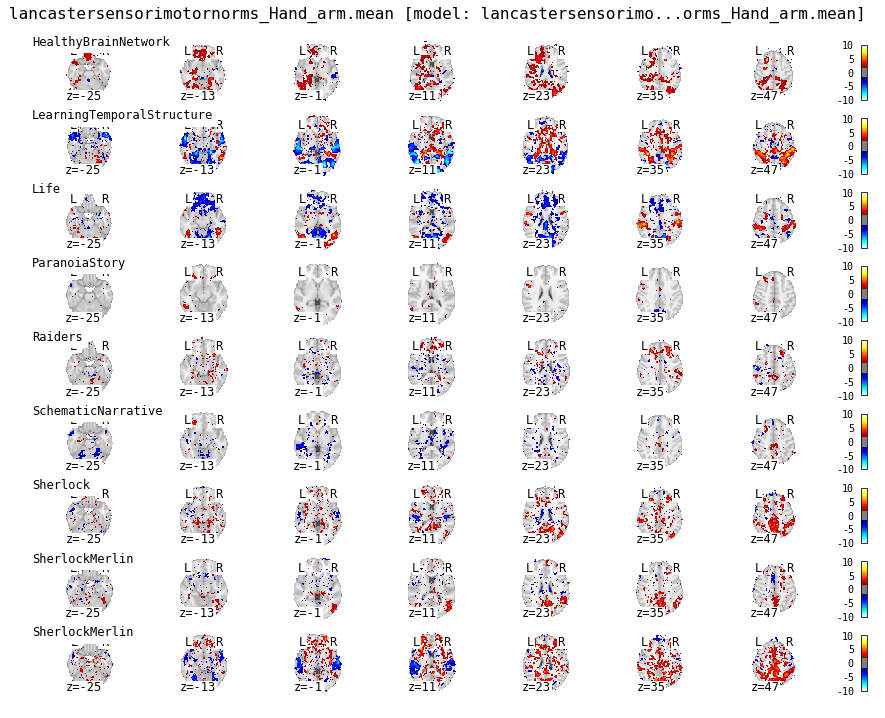

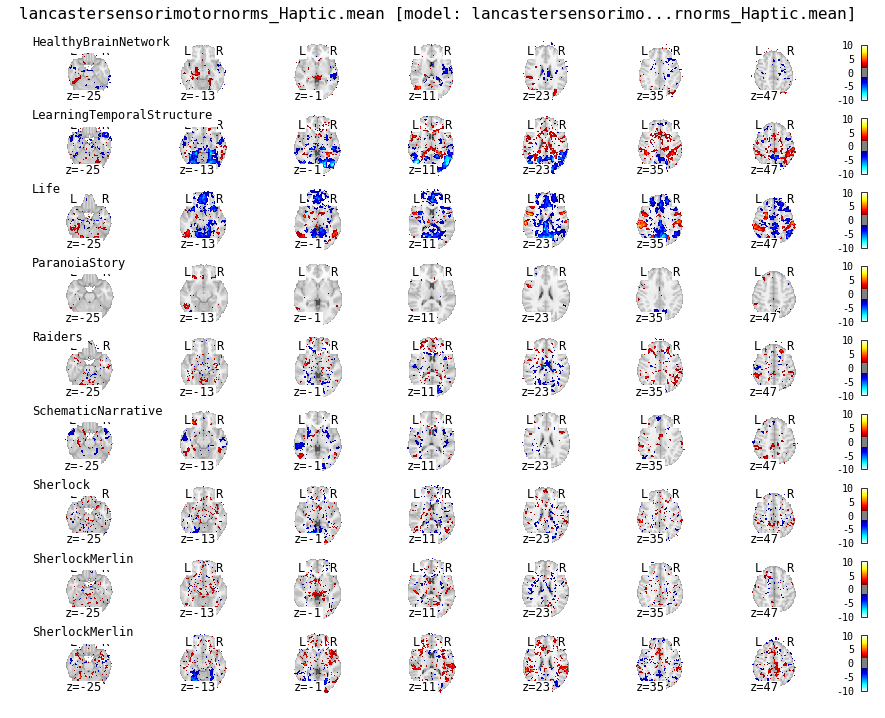

...

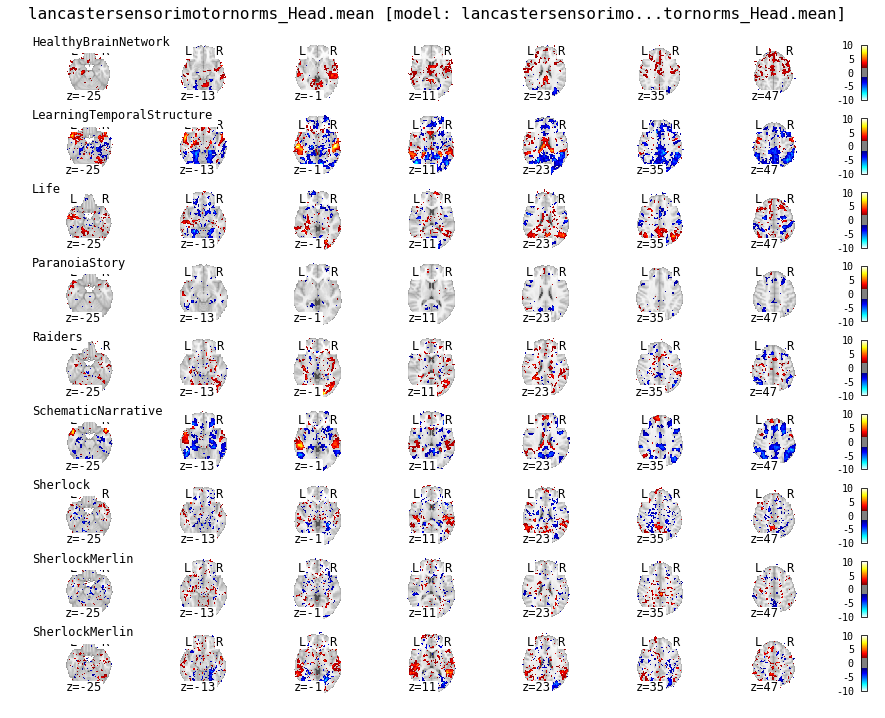

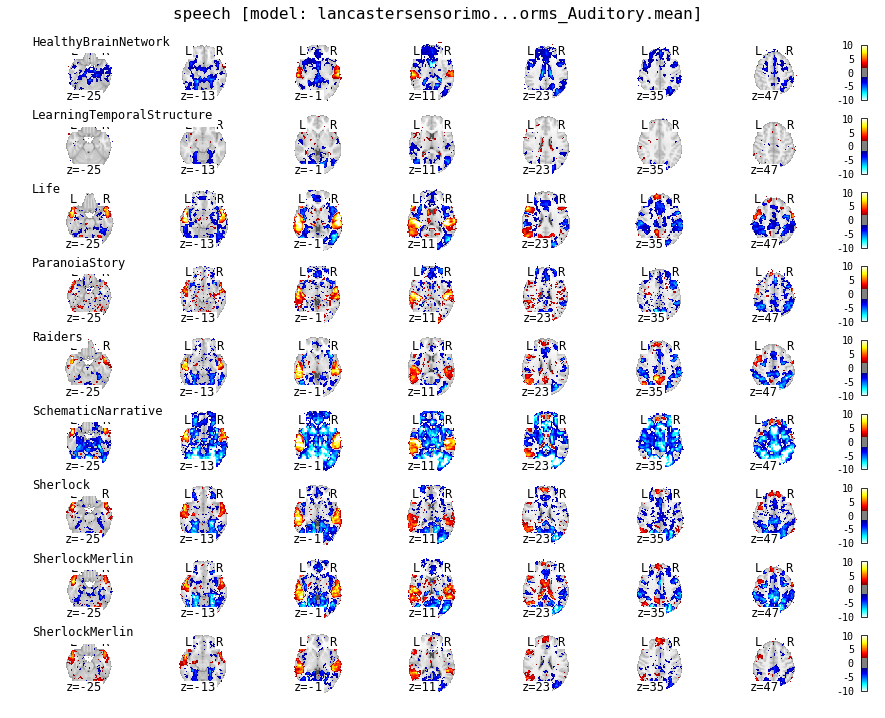

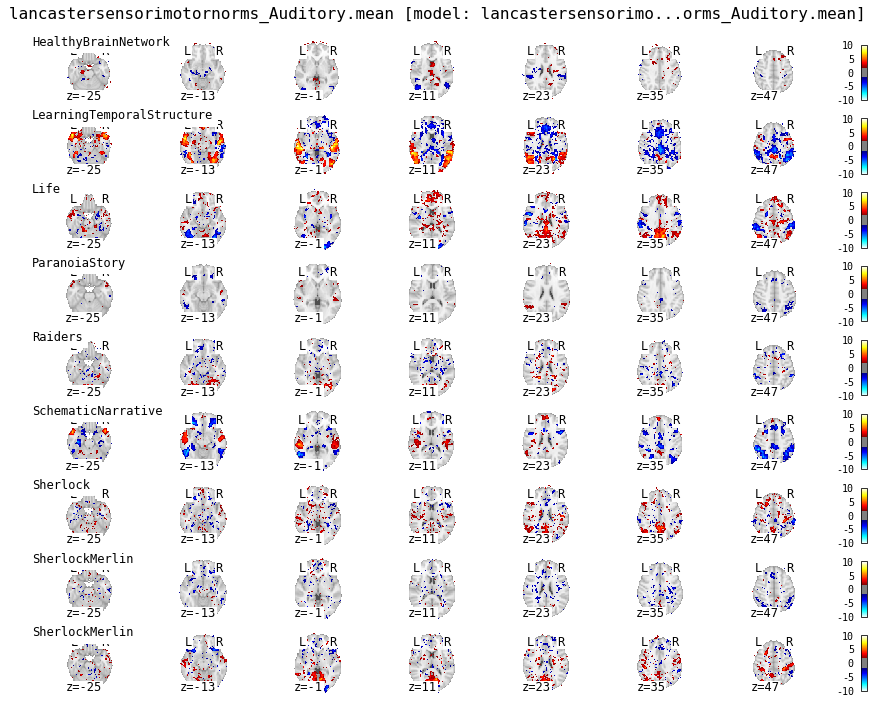

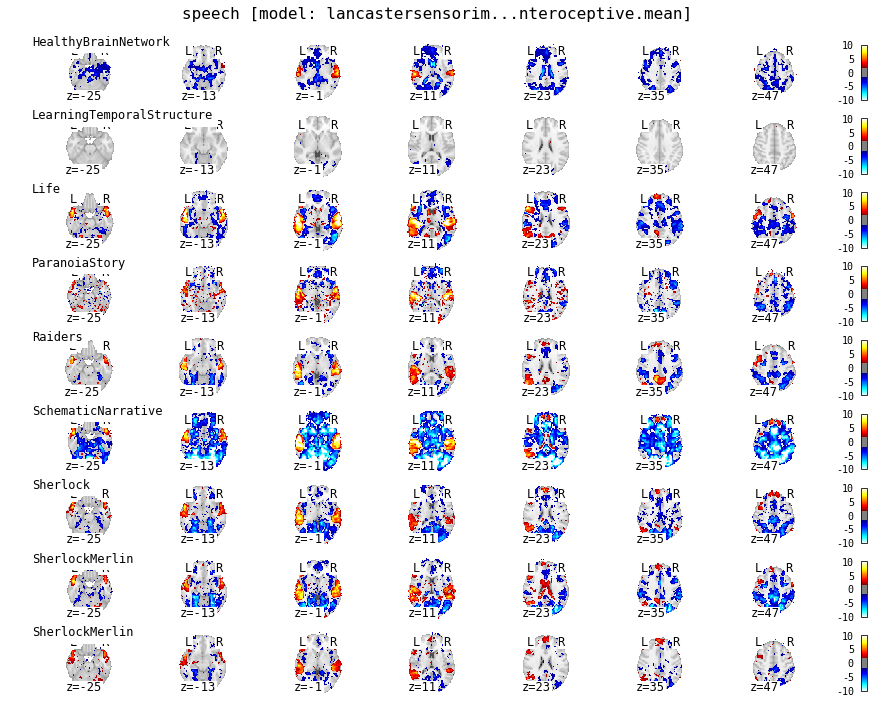

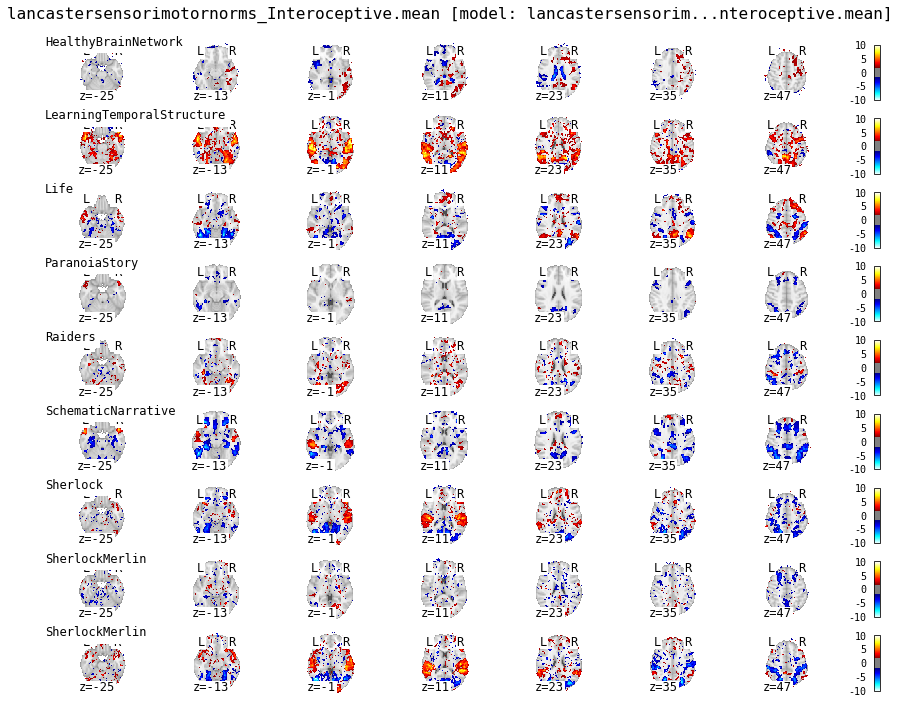

In [83]:
plot_contrast_by_analysis(flat_models,
                          vmax=10, draw_cross=True, 
                          figsize=(15,12), colorbar=True, threshold=1.96)